# Introduction
My stakeholder Mr Hanson asked me to inquire the housing market for him.
He has 5 kids, a very limited budget and is looking for a nice (social) neighbourhood
He is interested in the perfect Timing and Location to buy.

In [52]:
The following notebook will contain the following aspects of the taks:

1 Exploratory Data Analysis (EDA)

    Are there any null values or outliers? How will you wrangle/handle them?
    Are there any variables that warrant transformations?
    Are there any useful variables that you can engineer with the given data?
    Do you notice any patterns or anomalies in the data? Can you plot them?

Section 02: Statistical Analysis
Please run statistical tests in the form of regressions to answer these questions & propose data-driven action recommendations to your CMO. Make sure to interpret your results with non-statistical jargon so your CMO can understand your findings.

    What factors are significantly related to the number of store purchases?
    Does US fare significantly better than the Rest of the World in terms of total purchases?
    Your supervisor insists that people who buy gold are more conservative. Therefore, people who spent an above average amount on gold in the last 2 years would have more in store purchases. Justify or refute this statement using an appropriate statistical test
    Fish has Omega 3 fatty acids which are good for the brain. Accordingly, do "Married PhD candidates" have a significant relation with amount spent on fish? What other factors are significantly related to amount spent on fish? (Hint: use your knowledge of interaction variables/effects)
    Is there a significant relationship between geographical regional and success of a campaign?

Section 03: Data Visualization
Please plot and visualize the answers to the below questions.

    Which marketing campaign is most successful?
    What does the average customer look like for this company?
    Which products are performing best?
    Which channels are underperforming?


SyntaxError: invalid syntax (<ipython-input-52-ea8d62d884d9>, line 1)

## Assumptions:
> Mr Hansen will require above average no of bedrooms, >5
Child friendly neighbourhood -> check sex offender listing
social neighbourhood schools etc.

> possible cutbacks:
    - renovation
    - 

In [53]:
https://info.kingcounty.gov/assessor/esales/Glossary.aspx?type=r#g

SyntaxError: invalid syntax (<ipython-input-53-67b8c8d92a80>, line 1)

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import stats
import seaborn as sns
import statsmodels.formula.api as smf

In [3]:
# Load the dataset and have a look at the contents
king = pd.read_csv('../data/King_County_House_prices_dataset.csv')
king

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,...,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,...,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21592,263000018,5/21/2014,360000.0,3,2.50,1530,1131,3.0,0.0,0.0,...,8,1530,0.0,2009,0.0,98103,47.6993,-122.346,1530,1509
21593,6600060120,2/23/2015,400000.0,4,2.50,2310,5813,2.0,0.0,0.0,...,8,2310,0.0,2014,0.0,98146,47.5107,-122.362,1830,7200
21594,1523300141,6/23/2014,402101.0,2,0.75,1020,1350,2.0,0.0,0.0,...,7,1020,0.0,2009,0.0,98144,47.5944,-122.299,1020,2007
21595,291310100,1/16/2015,400000.0,3,2.50,1600,2388,2.0,NaN,0.0,...,8,1600,0.0,2004,0.0,98027,47.5345,-122.069,1410,1287


The dataframe looks neat and tidy. Column names are named apropriately no spaces or upper cases. Values are all numerals

In [4]:
# Check the info of the dataset

king.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     19221 non-null  float64
 9   view           21534 non-null  float64
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  object 
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   17755 non-null  float64
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

In [5]:
#Change 'date' to datetime format
king['date'] = pd.to_datetime(king['date'])

In [89]:
king.isnull().sum().sort_values(ascending = False)

yr_renovated     3842
waterfront       2376
view               63
id                  0
sqft_above          0
sqft_living15       0
long                0
lat                 0
zipcode             0
yr_built            0
sqft_basement       0
condition           0
grade               0
date                0
floors              0
sqft_lot            0
sqft_living         0
bathrooms           0
bedrooms            0
price               0
sqft_lot15          0
dtype: int64

Apart from the columns 'waterfront', 'view' and 'yr_renovated' all entries contain values.

In [90]:
#Look at the unique values in the columns that contain NaN entries
print(king.waterfront.unique())
print(king.view.unique())
print(king.yr_renovated.unique())

[nan  0.  1.]
[ 0. nan  3.  4.  2.  1.]
[   0. 1991.   nan 2002. 2010. 1992. 2013. 1994. 1978. 2005. 2003. 1984.
 1954. 2014. 2011. 1983. 1945. 1990. 1988. 1977. 1981. 1995. 2000. 1999.
 1998. 1970. 1989. 2004. 1986. 2007. 1987. 2006. 1985. 2001. 1980. 1971.
 1979. 1997. 1950. 1969. 1948. 2009. 2015. 1974. 2008. 1968. 2012. 1963.
 1951. 1962. 1953. 1993. 1996. 1955. 1982. 1956. 1940. 1976. 1946. 1975.
 1964. 1973. 1957. 1959. 1960. 1967. 1965. 1934. 1972. 1944. 1958.]


1. For the 'waterfront' column, the nan Values are obviously properties, where the waterfront info is not specified
2. For the 'view' column the nan values seem to represent houses, where the number of viewings has not been specified
3. For the 'yr_renovated' column the nan value seems to indicate, that the house probably never was renovated

In [6]:
#replace nan and 0 values for 'yr_renovated' with values from 'yr_built'
king.yr_renovated = np.where(king.yr_renovated.isnull(), king.yr_built, king.yr_renovated)
king.yr_renovated = np.where(king.yr_renovated == 0, king.yr_built, king.yr_renovated)
king
 

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,2014-10-13,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,...,7,1180,0.0,1955,1955.0,98178,47.5112,-122.257,1340,5650
1,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2015-02-25,180000.0,2,1.00,770,10000,1.0,0.0,0.0,...,6,770,0.0,1933,1933.0,98028,47.7379,-122.233,2720,8062
3,2487200875,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,7,1050,910.0,1965,1965.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,8,1680,0.0,1987,1987.0,98074,47.6168,-122.045,1800,7503
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21592,263000018,2014-05-21,360000.0,3,2.50,1530,1131,3.0,0.0,0.0,...,8,1530,0.0,2009,2009.0,98103,47.6993,-122.346,1530,1509
21593,6600060120,2015-02-23,400000.0,4,2.50,2310,5813,2.0,0.0,0.0,...,8,2310,0.0,2014,2014.0,98146,47.5107,-122.362,1830,7200
21594,1523300141,2014-06-23,402101.0,2,0.75,1020,1350,2.0,0.0,0.0,...,7,1020,0.0,2009,2009.0,98144,47.5944,-122.299,1020,2007
21595,291310100,2015-01-16,400000.0,3,2.50,1600,2388,2.0,NaN,0.0,...,8,1600,0.0,2004,2004.0,98027,47.5345,-122.069,1410,1287


In [7]:
king.sort_values('price', ascending = False)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
7245,6762700020,2014-10-13,7700000.0,6,8.00,12050,27600,2.5,0.0,3.0,...,13,8570,3480.0,1910,1987.0,98102,47.6298,-122.323,3940,8800
3910,9808700762,2014-06-11,7060000.0,5,4.50,10040,37325,2.0,1.0,2.0,...,11,7680,2360.0,1940,2001.0,98004,47.6500,-122.214,3930,25449
9245,9208900037,2014-09-19,6890000.0,6,7.75,9890,31374,2.0,0.0,4.0,...,13,8860,1030.0,2001,2001.0,98039,47.6305,-122.240,4540,42730
4407,2470100110,2014-08-04,5570000.0,5,5.75,9200,35069,2.0,0.0,0.0,...,13,6200,3000.0,2001,2001.0,98039,47.6289,-122.233,3560,24345
1446,8907500070,2015-04-13,5350000.0,5,5.00,8000,23985,2.0,0.0,4.0,...,12,6720,1280.0,2009,2009.0,98004,47.6232,-122.220,4600,21750
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2139,1623049041,2014-05-08,82500.0,2,1.00,520,22334,1.0,0.0,0.0,...,5,520,0.0,1951,1951.0,98168,47.4799,-122.296,1572,10570
8267,3883800011,2014-11-05,82000.0,3,1.00,860,10426,1.0,0.0,0.0,...,6,860,0.0,1954,1954.0,98146,47.4987,-122.341,1140,11250
16184,3028200080,2015-03-24,81000.0,2,1.00,730,9975,1.0,NaN,0.0,...,5,730,0.0,1943,1943.0,98168,47.4808,-122.315,860,9000
465,8658300340,2014-05-23,80000.0,1,0.75,430,5050,1.0,NaN,0.0,...,4,430,0.0,1912,1912.0,98014,47.6499,-121.909,1200,7500


count    2.159700e+04
mean     5.402966e+05
std      3.673681e+05
min      7.800000e+04
25%      3.220000e+05
50%      4.500000e+05
75%      6.450000e+05
max      7.700000e+06
Name: price, dtype: float64
/Users/damiandroste/neuefische/My_first_Project/.venv/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


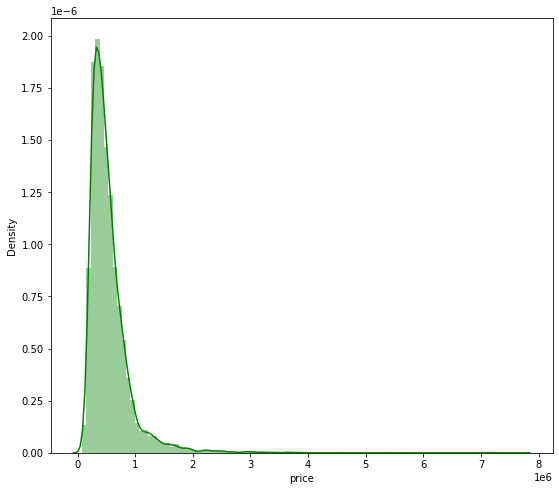

In [8]:
#plot the price distribution
print(king['price'].describe())
plt.figure(figsize=(9, 8))
sns.distplot(king['price'], color='g', bins=100, hist_kws={'alpha': 0.4});

<AxesSubplot:xlabel='date', ylabel='price'>

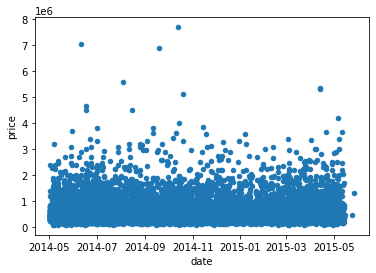

In [94]:
#Plot the saleprice against the time it was sold
king.plot(x = 'date', y= 'price', kind='scatter')

In [9]:
#split the datetime in year and month to get a better feel for possible patterns 
king['year_sold'] = pd.DatetimeIndex(king['date']).year
king['month_sold'] = pd.DatetimeIndex(king['date']).month

<AxesSubplot:xlabel='month_sold', ylabel='price'>

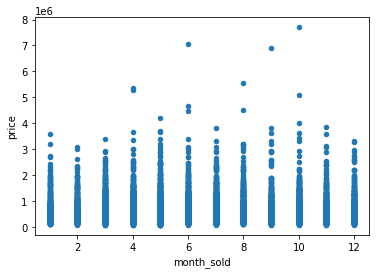

In [96]:
#Plot the Prices against salemonth
king.plot(x = 'month_sold', y= 'price', kind='scatter')

<AxesSubplot:xlabel='year_sold', ylabel='price'>

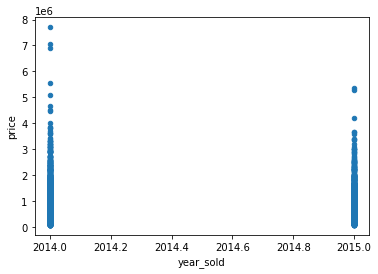

In [97]:
#Plot the Prices against saleyear
king.plot(x = 'year_sold', y= 'price', kind='scatter')

In [98]:
#Check the number of unique values for each column with a simple function

def unique_values(df):
    col_list = []
    for col_name in df.columns:
        col_list.append(col_name)
    print(col_list)
    for i in col_list:
        print ([df[i].nunique()])

unique_values(king)


['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long', 'sqft_living15', 'sqft_lot15', 'year_sold', 'month_sold']
[21420]
[372]
[3622]
[12]
[29]
[1034]
[9776]
[6]
[2]
[5]
[5]
[11]
[942]
[304]
[116]
[116]
[70]
[5033]
[751]
[777]
[8682]
[2]
[12]


In [99]:
#To get a more specific picture of the data, we need to filter it according to the stakeholders needs
#Check the number of possible zipcodes to check how many possible areas we have
king.zipcode.unique()

array([98178, 98125, 98028, 98136, 98074, 98053, 98003, 98198, 98146,
       98038, 98007, 98115, 98107, 98126, 98019, 98103, 98002, 98133,
       98040, 98092, 98030, 98119, 98112, 98052, 98027, 98117, 98058,
       98001, 98056, 98166, 98023, 98070, 98148, 98105, 98042, 98008,
       98059, 98122, 98144, 98004, 98005, 98034, 98075, 98116, 98010,
       98118, 98199, 98032, 98045, 98102, 98077, 98108, 98168, 98177,
       98065, 98029, 98006, 98109, 98022, 98033, 98155, 98024, 98011,
       98031, 98106, 98072, 98188, 98014, 98055, 98039])

In [10]:
#From Niche.com we acquired a rating of the family friendlyness of washington living areas by zipcode. This rating is based on crime statistics, school ratings etc
 
ranking = (98074, 1, 98029, 2, 98052, 3, 98075, 4, 98005, 5, 98006, 6, 98007, 7, 98004, 8, 98008, 9, 98040, 10, 98053, 11, 98039, 12, 98033, 13, 98021, 14, 98027, 15, 98065,16, 98110, 17, 98607,18, 98059, 19, 99203, 20, 98077, 21, 98115, 22, 98028, 23, 98011, 24, 98034, 25, 98012, 26, 98117, 27, 98144, 28, 98112, 29, 98072, 30, 98103, 31, 98155, 32, 98177, 33, 98199, 34, 98122, 35, 98119, 36, 98327, 37, 98038, 38, 98116, 39, 98105, 40, 98109, 41, 99354, 42, 99019, 43, 99353, 44, 98024, 45, 98125, 46, 98126, 47, 98118, 48, 99223, 49, 99338, 50, 98275, 51, 98136, 52, 98019, 53, 98102, 54, 98296, 55, 98058, 56, 98106, 57, 98121, 58, 98229, 59, 98501, 60, 98506, 61, 99352, 62, 99163, 63, 98107, 64, 98036, 65, 98133, 66, 98056, 67, 98502, 68, 98388, 69, 98108, 70, 98467, 71, 98466, 72, 99208, 73, 98020, 74, 98516, 75, 98045, 76, 98031, 77, 99016, 78, 98685, 79,98823, 80, 99021, 81, 98026, 82, 98383, 83, 98208, 84, 99204, 85, 98037, 86, 98683, 87, 98043, 88, 98101, 89, 98406, 90, 98424, 91, 98503, 92, 98092, 93, 99224, 94, 98087, 95, 98368, 96, 98422, 97, 98010, 98, 98178, 99, 98392, 100, 98042, 101, 98439, 102, 98370, 103, 98146, 104, 98335, 105, 98512, 106, 98104, 107, 98391, 108, 99205, 109, 98277, 110, 98403, 111, 98221, 112, 99301, 113, 99111, 114, 98390, 115, 98404, 116, 99336, 117, 98371, 118, 98332, 119, 98513, 120, 98682, 121, 98311, 122, 99202, 123, 98055, 124, 98375, 125, 98047, 126, 98498, 127, 98374, 128, 98373, 129, 98225, 130, 98801, 131, 99217, 132, 99207, 133, 99218, 134, 98001, 135, 98405, 136, 98836, 137, 98205, 138, 99037, 139, 98226, 140, 99337, 141, 98014, 142, 98003, 143, 99206, 144, 99362, 145, 98023, 146, 98815, 147, 99022, 148, 98684, 149, 98002, 150, 98802, 151, 98203, 152, 98606, 153, 98908, 154, 98563, 155, 98903, 156, 98204, 157, 98166, 158, 98188, 159, 98030, 160, 98443, 161, 98671, 162, 98686, 163, 98372, 164, 98333, 165, 98642, 166, 98664, 167, 98032, 168, 98258, 169, 98148, 170, 98409, 171, 99324, 172, 98826, 173, 98290, 174, 98418, 175, 98665, 176, 98273, 177, 98407, 178, 98329, 179, 98841, 180, 98198, 181, 98408, 182, 99004, 183, 99212, 184, 98605, 185, 98248, 186, 98586, 187, 99201, 188, 98346, 189, 98312, 190, 98901, 191, 98321, 192, 99350, 193, 98840, 194, 98230, 195, 98663, 196, 99114, 197, 98057, 198, 98902, 199, 98362, 200, 98444, 201, 98349, 202, 99323, 203, 98837, 204, 98520, 205, 98953, 206, 98201, 207, 98354, 208, 98295, 209, 98272, 210, 99328, 211, 98532, 212, 99403, 213, 98168, 214, 98661, 215, 98816, 216, 98342, 217, 98264, 218, 98499, 219, 98247, 220, 98662, 221, 98022, 222) 
#Zip_code_ranking = dict(itertools.zip_longest(*[iter(ranking)] * 2, fillvalue=""))
#Zip_code_ranking

In [11]:
#Converting the list of ratings to a dictionary
def Convert(lst):
    res_dct = {lst[i]: lst[i + 1] for i in range(0, len(lst), 2)}
    return res_dct
        
zipcode_ranking = Convert(ranking)
zipcode_ranking

{98074: 1,
 98029: 2,
 98052: 3,
 98075: 4,
 98005: 5,
 98006: 6,
 98007: 7,
 98004: 8,
 98008: 9,
 98040: 10,
 98053: 11,
 98039: 12,
 98033: 13,
 98021: 14,
 98027: 15,
 98065: 16,
 98110: 17,
 98607: 18,
 98059: 19,
 99203: 20,
 98077: 21,
 98115: 22,
 98028: 23,
 98011: 24,
 98034: 25,
 98012: 26,
 98117: 27,
 98144: 28,
 98112: 29,
 98072: 30,
 98103: 31,
 98155: 32,
 98177: 33,
 98199: 34,
 98122: 35,
 98119: 36,
 98327: 37,
 98038: 38,
 98116: 39,
 98105: 40,
 98109: 41,
 99354: 42,
 99019: 43,
 99353: 44,
 98024: 45,
 98125: 46,
 98126: 47,
 98118: 48,
 99223: 49,
 99338: 50,
 98275: 51,
 98136: 52,
 98019: 53,
 98102: 54,
 98296: 55,
 98058: 56,
 98106: 57,
 98121: 58,
 98229: 59,
 98501: 60,
 98506: 61,
 99352: 62,
 99163: 63,
 98107: 64,
 98036: 65,
 98133: 66,
 98056: 67,
 98502: 68,
 98388: 69,
 98108: 70,
 98467: 71,
 98466: 72,
 99208: 73,
 98020: 74,
 98516: 75,
 98045: 76,
 98031: 77,
 99016: 78,
 98685: 79,
 98823: 80,
 99021: 81,
 98026: 82,
 98383: 83,
 98208: 84,
 

In [12]:
# Adding the rating values to the dataframe
king['zipcode_rating']= king['zipcode'].map(zipcode_ranking)
king

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year_sold,month_sold,zipcode_rating
0,7129300520,2014-10-13,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,...,1955,1955.0,98178,47.5112,-122.257,1340,5650,2014,10,99.0
1,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,1951,1991.0,98125,47.7210,-122.319,1690,7639,2014,12,46.0
2,5631500400,2015-02-25,180000.0,2,1.00,770,10000,1.0,0.0,0.0,...,1933,1933.0,98028,47.7379,-122.233,2720,8062,2015,2,23.0
3,2487200875,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,1965,1965.0,98136,47.5208,-122.393,1360,5000,2014,12,52.0
4,1954400510,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,1987,1987.0,98074,47.6168,-122.045,1800,7503,2015,2,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21592,263000018,2014-05-21,360000.0,3,2.50,1530,1131,3.0,0.0,0.0,...,2009,2009.0,98103,47.6993,-122.346,1530,1509,2014,5,31.0
21593,6600060120,2015-02-23,400000.0,4,2.50,2310,5813,2.0,0.0,0.0,...,2014,2014.0,98146,47.5107,-122.362,1830,7200,2015,2,104.0
21594,1523300141,2014-06-23,402101.0,2,0.75,1020,1350,2.0,0.0,0.0,...,2009,2009.0,98144,47.5944,-122.299,1020,2007,2014,6,28.0
21595,291310100,2015-01-16,400000.0,3,2.50,1600,2388,2.0,NaN,0.0,...,2004,2004.0,98027,47.5345,-122.069,1410,1287,2015,1,15.0


In [30]:
# check info of the database to see if all houses are within the top 222 zipcodes of washington king.info()
print(king.info())
# zipcode ratings that contain a nan value entry are neighbourhoods rated below #222 so we assume, they are bad neighbourhoods and they will equal 223 for >= 223
king.zipcode_rating.fillna(223, inplace = True)
king

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 26 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   id              21597 non-null  int64         
 1   date            21597 non-null  datetime64[ns]
 2   price           21597 non-null  float64       
 3   bedrooms        21597 non-null  int64         
 4   bathrooms       21597 non-null  float64       
 5   sqft_living     21597 non-null  int64         
 6   sqft_lot        21597 non-null  int64         
 7   floors          21597 non-null  float64       
 8   waterfront      19221 non-null  float64       
 9   view            21534 non-null  float64       
 10  condition       21597 non-null  int64         
 11  grade           21597 non-null  int64         
 12  sqft_above      21597 non-null  int64         
 13  sqft_basement   21597 non-null  int64         
 14  yr_built        21597 non-null  int64         
 15  yr

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,zipcode,lat,long,sqft_living15,sqft_lot15,year_sold,month_sold,zipcode_rating,sqft_price,sqft_price_lot
0,7129300520,2014-10-13,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,...,98178,47.5112,-122.257,1340,5650,2014,10,99.0,188.050847,39.274336
1,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,98125,47.7210,-122.319,1690,7639,2014,12,46.0,209.338521,74.288870
2,5631500400,2015-02-25,180000.0,2,1.00,770,10000,1.0,0.0,0.0,...,98028,47.7379,-122.233,2720,8062,2015,2,23.0,233.766234,18.000000
3,2487200875,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,98136,47.5208,-122.393,1360,5000,2014,12,52.0,308.163265,120.800000
4,1954400510,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,98074,47.6168,-122.045,1800,7503,2015,2,1.0,303.571429,63.118812
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21592,263000018,2014-05-21,360000.0,3,2.50,1530,1131,3.0,0.0,0.0,...,98103,47.6993,-122.346,1530,1509,2014,5,31.0,235.294118,318.302387
21593,6600060120,2015-02-23,400000.0,4,2.50,2310,5813,2.0,0.0,0.0,...,98146,47.5107,-122.362,1830,7200,2015,2,104.0,173.160173,68.811285
21594,1523300141,2014-06-23,402101.0,2,0.75,1020,1350,2.0,0.0,0.0,...,98144,47.5944,-122.299,1020,2007,2014,6,28.0,394.216667,297.852593
21595,291310100,2015-01-16,400000.0,3,2.50,1600,2388,2.0,NaN,0.0,...,98027,47.5345,-122.069,1410,1287,2015,1,15.0,250.000000,167.504188


In [14]:
# add more columns one showing the living space taken by the basement, one showing the price per squarefoot for the home and one showing the price per squarefoot for the lot 
king['sqft_basement'] = king['sqft_living']-king['sqft_above']
king['sqft_price'] = king['price']/king['sqft_living']
king['sqft_price_lot'] = king['price']/king['sqft_lot']
king

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,zipcode,lat,long,sqft_living15,sqft_lot15,year_sold,month_sold,zipcode_rating,sqft_price,sqft_price_lot
0,7129300520,2014-10-13,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,...,98178,47.5112,-122.257,1340,5650,2014,10,99.0,188.050847,39.274336
1,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,98125,47.7210,-122.319,1690,7639,2014,12,46.0,209.338521,74.288870
2,5631500400,2015-02-25,180000.0,2,1.00,770,10000,1.0,0.0,0.0,...,98028,47.7379,-122.233,2720,8062,2015,2,23.0,233.766234,18.000000
3,2487200875,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,98136,47.5208,-122.393,1360,5000,2014,12,52.0,308.163265,120.800000
4,1954400510,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,98074,47.6168,-122.045,1800,7503,2015,2,1.0,303.571429,63.118812
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21592,263000018,2014-05-21,360000.0,3,2.50,1530,1131,3.0,0.0,0.0,...,98103,47.6993,-122.346,1530,1509,2014,5,31.0,235.294118,318.302387
21593,6600060120,2015-02-23,400000.0,4,2.50,2310,5813,2.0,0.0,0.0,...,98146,47.5107,-122.362,1830,7200,2015,2,104.0,173.160173,68.811285
21594,1523300141,2014-06-23,402101.0,2,0.75,1020,1350,2.0,0.0,0.0,...,98144,47.5944,-122.299,1020,2007,2014,6,28.0,394.216667,297.852593
21595,291310100,2015-01-16,400000.0,3,2.50,1600,2388,2.0,NaN,0.0,...,98027,47.5345,-122.069,1410,1287,2015,1,15.0,250.000000,167.504188


<AxesSubplot:xlabel='zipcode_rating', ylabel='sqft_price'>

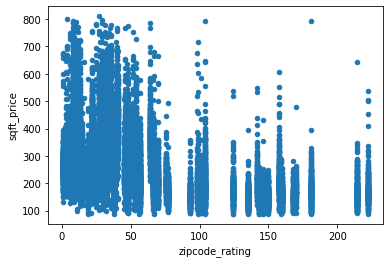

In [15]:
#Test plot to see how the price per squarefoot might be related to the rating of the neighbourhood
king.plot(x = 'zipcode_rating', y= 'sqft_price', kind='scatter')

<AxesSubplot:xlabel='zipcode_rating', ylabel='sqft_price_lot'>

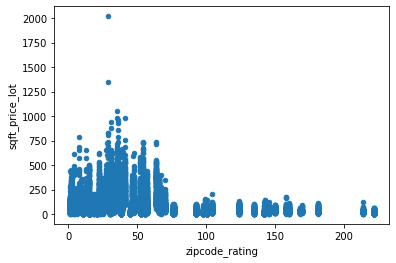

In [16]:
king.plot(x = 'zipcode_rating', y= 'sqft_price_lot', kind='scatter')

In the next step We will adjust the dataframe to show the data relevant for our stakeholder

In [17]:
#The stakeholder has 5 children. Assuming that a maximum of four children will share a bedroom, we will assume that the family requires at least 4 bedrooms
king_stake = pd.DataFrame(king.query('bedrooms >= 4'))
king_stake

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,zipcode,lat,long,sqft_living15,sqft_lot15,year_sold,month_sold,zipcode_rating,sqft_price,sqft_price_lot
3,2487200875,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,98136,47.5208,-122.393,1360,5000,2014,12,52.0,308.163265,120.800000
5,7237550310,2014-05-12,1230000.0,4,4.50,5420,101930,1.0,0.0,0.0,...,98053,47.6561,-122.005,4760,101930,2014,5,11.0,226.937269,12.067105
14,1175000570,2015-03-12,530000.0,5,2.00,1810,4850,1.5,0.0,0.0,...,98107,47.6700,-122.394,1360,4850,2015,3,64.0,292.817680,109.278351
15,9297300055,2015-01-24,650000.0,4,3.00,2950,5000,2.0,0.0,3.0,...,98126,47.5714,-122.375,2140,4000,2015,1,47.0,220.338983,130.000000
17,6865200140,2014-05-29,485000.0,4,1.00,1600,4300,1.5,0.0,0.0,...,98103,47.6648,-122.343,1610,4300,2014,5,31.0,303.125000,112.790698
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21583,7202300110,2014-09-15,810000.0,4,3.00,3990,7838,2.0,0.0,0.0,...,98053,47.6857,-122.046,3370,6814,2014,9,11.0,203.007519,103.342689
21584,249000205,2014-10-15,1540000.0,5,3.75,4470,8088,2.0,0.0,0.0,...,98004,47.6321,-122.200,2780,8964,2014,10,8.0,344.519016,190.405539
21589,3448900210,2014-10-14,610685.0,4,2.50,2520,6023,2.0,0.0,NaN,...,98056,47.5137,-122.167,2520,6023,2014,10,67.0,242.335317,101.392163
21590,7936000429,2015-03-26,1010000.0,4,3.50,3510,7200,2.0,0.0,0.0,...,98136,47.5537,-122.398,2050,6200,2015,3,52.0,287.749288,140.277778


The stakeholder mentioned a very tight budget, so we are going to neglect items that went for over $400000.

In [22]:

king_stake = king_stake.query('price < 400000')
king_stake

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,zipcode,lat,long,sqft_living15,sqft_lot15,year_sold,month_sold,zipcode_rating,sqft_price,sqft_price_lot
20,6300500875,2014-05-14,385000.0,4,1.75,1620,4980,1.0,0.0,0.0,...,98133,47.7025,-122.341,1400,4980,2014,5,66.0,237.654321,77.309237
22,7137970340,2014-07-03,285000.0,5,2.50,2270,6300,2.0,0.0,0.0,...,98092,47.3266,-122.169,2240,7005,2014,7,93.0,125.550661,45.238095
34,7955080270,2014-12-03,322500.0,4,2.75,2060,6659,1.0,0.0,0.0,...,98058,47.4276,-122.157,2020,8720,2014,12,56.0,156.553398,48.430695
38,7895500070,2015-02-13,240000.0,4,1.00,1220,8075,1.0,0.0,0.0,...,98001,47.3341,-122.282,1290,7800,2015,2,135.0,196.721311,29.721362
51,7231300125,2015-02-17,345000.0,5,2.50,3150,9134,1.0,0.0,0.0,...,98056,47.4934,-122.189,1990,9133,2015,2,67.0,109.523810,37.770966
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21519,2909310100,2014-10-15,332000.0,4,2.50,2380,5737,2.0,0.0,0.0,...,98023,47.2815,-122.356,2380,5396,2014,10,146.0,139.495798,57.869967
21521,1043000100,2014-12-11,370000.0,4,2.50,2531,6843,2.0,0.0,0.0,...,98030,47.3850,-122.189,2604,6238,2014,12,160.0,146.187278,54.069852
21547,9406530090,2014-10-20,337000.0,4,2.50,2470,5100,2.0,0.0,0.0,...,98038,47.3622,-122.041,2240,5123,2014,10,38.0,136.437247,66.078431
21549,5007500120,2015-02-26,341780.0,4,2.75,2260,4440,2.0,0.0,0.0,...,98001,47.3507,-122.291,2260,4563,2015,2,135.0,151.230088,76.977477


In [ ]:
The Stakeholder was mainly focused on his kids his budget and the quality of the neighbourhood, so we are going to neglect view and waterfront options. We are also dropping the id info as well as the longitude and latitude info and exact date of sale

In [24]:
king_stake_comp = king_stake.drop(columns=['id', 'waterfront', 'view', 'lat', 'long', 'date' ]).select_dtypes(include=np.number)
king_stake_comp.sort_values('zipcode_rating')

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,sqft_living15,sqft_lot15,year_sold,month_sold,zipcode_rating,sqft_price,sqft_price_lot
19110,390000.0,4,1.75,2020,9750,1.0,3,7,1100,920,1975,1975.0,98074,1670,9600,2014,8,1.0,193.069307,40.000000
12379,385000.0,4,2.50,1950,7350,1.0,3,7,1150,800,1963,1963.0,98052,2050,9068,2014,12,3.0,197.435897,52.380952
480,378500.0,4,1.75,1700,8640,1.0,3,7,850,850,1955,1955.0,98006,1620,9000,2014,11,6.0,222.647059,43.807870
11658,320000.0,4,1.50,1100,11824,1.0,4,7,1100,0,1954,1954.0,98006,1380,11796,2014,8,6.0,290.909091,27.063599
397,365000.0,4,2.00,1940,25600,1.0,1,8,1940,0,1962,1962.0,98006,2000,10071,2014,6,6.0,188.144330,14.257812
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7251,308950.0,4,2.50,1920,8562,2.0,4,7,1920,0,1994,1994.0,98022,1820,8628,2014,7,222.0,160.911458,36.083859
343,309600.0,4,1.75,1275,20000,1.0,4,6,1275,0,1991,1991.0,98070,1660,20000,2014,10,NaN,242.823529,15.480000
13828,355000.0,4,3.00,2580,9601,2.0,4,7,2130,450,1992,1992.0,98070,1900,10092,2015,2,NaN,137.596899,36.975315
16556,340000.0,4,1.00,1200,11834,1.0,3,6,1200,0,1972,1972.0,98070,1670,47462,2014,11,NaN,283.333333,28.730776


In [52]:
Top_100_Neighbourhoods = pd.DataFrame(king_stake_comp.query('zipcode_rating <= 100').sort_values('zipcode_rating'))
Top_100_Neighbourhoods

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,sqft_living15,sqft_lot15,year_sold,month_sold,zipcode_rating,sqft_price,sqft_price_lot
19110,390000.0,4,1.75,2020,9750,1.0,3,7,1100,920,1975,1975.0,98074,1670,9600,2014,8,1.0,193.069307,40.000000
12379,385000.0,4,2.50,1950,7350,1.0,3,7,1150,800,1963,1963.0,98052,2050,9068,2014,12,3.0,197.435897,52.380952
397,365000.0,4,2.00,1940,25600,1.0,1,8,1940,0,1962,1962.0,98006,2000,10071,2014,6,6.0,188.144330,14.257812
480,378500.0,4,1.75,1700,8640,1.0,3,7,850,850,1955,1955.0,98006,1620,9000,2014,11,6.0,222.647059,43.807870
8004,375000.0,4,2.00,2070,9822,1.0,5,7,2070,0,1955,1955.0,98006,1300,9572,2014,8,6.0,181.159420,38.179597
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19783,385000.0,4,2.50,2560,6238,2.0,3,8,2560,0,2007,2007.0,98178,2560,6240,2014,11,99.0,150.390625,61.718500
16186,326000.0,4,1.75,2290,7380,1.0,3,7,1390,900,1963,1963.0,98178,1170,7381,2014,11,99.0,142.358079,44.173442
1987,335000.0,4,2.50,2330,7050,2.0,3,8,2330,0,1998,1998.0,98178,1810,5424,2014,11,99.0,143.776824,47.517730
18388,235000.0,4,1.00,1500,6360,1.5,3,6,1500,0,1944,1944.0,98178,1190,6360,2014,8,99.0,156.666667,36.949686


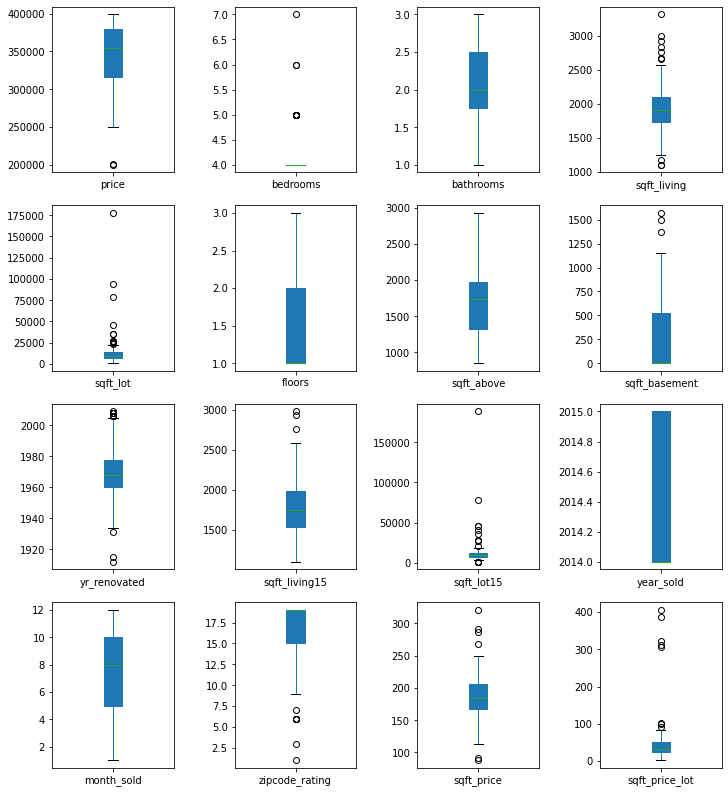

In [53]:
#Check the data for outliers

#first select the columns to check for outliers
outlier_check = Top_20_Neighbourhoods.drop(columns=['condition', 'grade', 'zipcode', 'yr_built']).select_dtypes(include=np.number)

#Boxplot the selected columns
outlier_check.plot(subplots=True, layout=(4,4), kind='box', figsize=(12,14), patch_artist=True)
plt.subplots_adjust(wspace=0.5);



In [62]:
Top_50_Neighbourhoods.groupby('zipcode_rating').mean()['sqft_price_lot']

zipcode_rating
1.0      40.000000
3.0      52.380952
6.0      30.378445
7.0      38.562092
9.0      47.790760
11.0     16.285011
13.0     34.501119
15.0    161.286609
16.0     23.341572
19.0     39.297629
21.0     35.370635
22.0     61.624650
23.0     33.481534
24.0     41.574546
25.0     40.242969
27.0     75.610874
28.0     90.279875
30.0     28.444047
31.0    146.381947
32.0     38.979350
33.0     40.539536
35.0     82.110495
38.0     59.217697
39.0     61.353128
45.0     21.419747
46.0     46.006067
47.0     57.569117
48.0     61.397015
Name: sqft_price_lot, dtype: float64

<AxesSubplot:xlabel='condition', ylabel='price'>

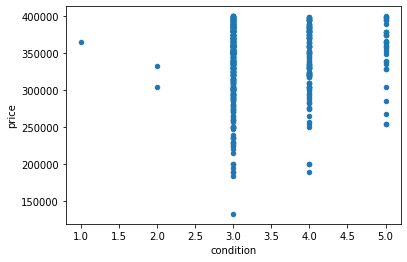

In [61]:
Top_50_Neighbourhoods.plot(x = 'condition', y= 'price', kind='scatter')

<AxesSubplot:xlabel='month_sold', ylabel='price'>

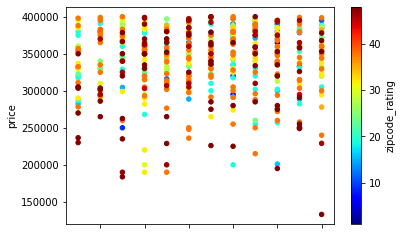

In [94]:
Top_50_Neighbourhoods.plot(c = 'zipcode_rating', x = 'month_sold', y= 'price', kind='scatter',cmap=CM.jet)

<AxesSubplot:xlabel='zipcode_rating', ylabel='sqft_price_lot'>

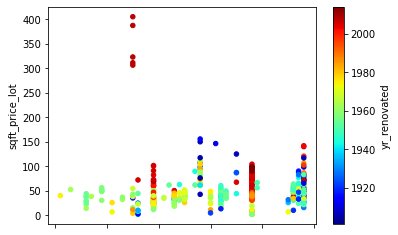

In [92]:
from matplotlib import cm as CM

Top_50_Neighbourhoods.plot(c='yr_renovated', x = 'zipcode_rating', y= 'sqft_price_lot', kind='scatter',cmap=CM.jet)

Test for possible models in the Dataset

In [65]:
# list of all possible exlanatory variables
explanatory_vars = list(Top_50_Neighbourhoods.columns)
explanatory_vars = [e for e in explanatory_vars 
                        if e not in ('bedrooms', 'bathrooms', 'floors')]
explanatory_vars

['price',
 'sqft_living',
 'sqft_lot',
 'condition',
 'grade',
 'sqft_above',
 'sqft_basement',
 'yr_built',
 'yr_renovated',
 'zipcode',
 'sqft_living15',
 'sqft_lot15',
 'year_sold',
 'month_sold',
 'zipcode_rating',
 'sqft_price',
 'sqft_price_lot']

In [75]:
# simple linear regression with each explanatory variable
print('R squared for each possible explanatory variable:' )
for explanatory_var in explanatory_vars:
    model = 'sqft_price ~ {:}'.format(explanatory_var)
    rs = smf.ols(formula=model, data=Top_50_Neighbourhoods).fit().rsquared
    print('{:7s} \t \t= {:.3}'.format(explanatory_var, rs))
    
# sales predicting salesis included as explanatory variable for sanity check

R squared for each possible explanatory variable:
price   	 	= 0.0744
sqft_living 	 	= 0.597
sqft_lot 	 	= 0.000976
condition 	 	= 0.0334
grade   	 	= 0.109
sqft_above 	 	= 0.304
sqft_basement 	 	= 0.0211
yr_built 	 	= 0.132
yr_renovated 	 	= 0.146
zipcode 	 	= 0.0543
sqft_living15 	 	= 0.21
sqft_lot15 	 	= 0.000312
year_sold 	 	= 0.000198
month_sold 	 	= 9.01e-05
zipcode_rating 	 	= 0.0325
sqft_price 	 	= 1.0
sqft_price_lot 	 	= 0.00528


In [102]:
# use all explanatory variables
model = 'sqft_price_lot ~ condition + grade + yr_renovated + zipcode_rating'
smf.ols(formula=model, data=Top_50_Neighbourhoods).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:         sqft_price_lot   R-squared:                       0.072
Model:                            OLS   Adj. R-squared:                  0.065
Method:                 Least Squares   F-statistic:                     9.918
Date:                Mon, 31 May 2021   Prob (F-statistic):           9.80e-08
Time:                        19:48:18   Log-Likelihood:                -2589.1
No. Observations:                 516   AIC:                             5188.
Df Residuals:                     511   BIC:                             5209.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept       -568.9938    136.725     -4.162      0.000    -837.607    -300.381
condition         -6.0277      2.827     -2.132      0.033     -11.581      -0.474
grade             -4.7937      2.888     -1.660      0.098     -10.467       0.880
yr_renovated       0.3402      0.073      4.689      0.000       0.198       0.483
zipcode_rating     0.1706      0.151      1.133      0.258      -0.125       0.466
==============================================================================
Omnibus:                      562.442   Durbin-Watson:                   1.429
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            31656.872
Skew:                           5.023   Prob(JB):                         0.00
Kurtosis:                      40.033   Cond. No.                     1.67e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.67e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [77]:
# best R^2 for "price", let's print the whole linear regression summary
smf.ols(formula='sqft_price ~ yr_built', data=Top_50_Neighbourhoods).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             sqft_price   R-squared:                       0.132
Model:                            OLS   Adj. R-squared:                  0.130
Method:                 Least Squares   F-statistic:                     78.02
Date:                Mon, 31 May 2021   Prob (F-statistic):           1.62e-17
Time:                        18:44:20   Log-Likelihood:                -2658.9
No. Observations:                 516   AIC:                             5322.
Df Residuals:                     514   BIC:                             5330.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1339.9626    131.110     10.220      0.000    1082.385    1597.540
yr_built      -0.5870      0.066     -8.833      0.000      -0.718      -0.456
==============================================================================
Omnibus:                       49.748   Durbin-Watson:                   1.671
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               82.289
Skew:                           0.635   Prob(JB):                     1.35e-18
Kurtosis:                       4.488   Cond. No.                     1.40e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.4e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [115]:
import plotly.graph_objects as go

import pandas as pd

#df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2011_february_us_airport_traffic.csv')
king['text'] = king['price']

fig = go.Figure(data=go.Scattergeo(
        lon = king['long'],
        lat = king['lat'],
        text = king['text'],
        mode = 'markers',
        marker_color = king['zipcode_rating']
        ))

fig.update_layout(geo = dict(
        scope = 'north america',
        showland = True,
        landcolor = "rgb(212, 212, 212)",
        subunitcolor = "rgb(255, 255, 255)",
        countrycolor = "rgb(255, 255, 255)",
        showlakes = True,
        lakecolor = "rgb(255, 255, 255)",
        showsubunits = True,
        showcountries = True,
        resolution = 150,
        projection = dict(
            type = 'conic conformal',
            rotation_lon = -100
        ),
        lonaxis = dict(
            showgrid = True,
            gridwidth = 0.5,
            range= [ -140.0, -55.0 ],
            dtick = 5
        ),
        lataxis = dict (
            showgrid = True,
            gridwidth = 0.5,
            range= [ 20.0, 60.0 ],
            dtick = 5
        )
    ),
        title = 'Most trafficked US airports<br>(Hover for airport names)',
       
    )
fig.show()